<a href="https://colab.research.google.com/github/AdityaSinghDevs/SkySentinel-X/blob/main/SkySentinel_X.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install -Uqq fastai scikit-learn
import os
import numpy as np
import pandas as pd
from fastai.vision.all import *
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.utils.class_weight import compute_class_weight
import matplotlib.pyplot as plt
import seaborn as sns
# import shutil
# import warnings
# warnings.filterwarnings("ignore")



   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 235.3/235.3 kB 8.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.7/9.7 MB 61.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.3/79.3 kB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 66.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 36.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 51.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 8.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.

In [2]:
# from google.colab import drive
# drive.mount('/content/drive')

#Setting up all the paths we gonna use
base_path = Path("/content/drive/MyDrive/DIAT-uSAT_dataset")
dataset_path = base_path / "Dataset"
model_export_path = base_path / "Model"
model_export_path.mkdir(exist_ok=True)

#image settings
IMG_SIZE = (224,224) #standardizing for ResNet50
BATCH_SIZE = 32
VALID_SPLIT = 0.2
SEED = 42

Total Images : 4065
class dist. : 
label
drone                  835
3_short_blade_rotor    816
rc_plane               814
3_long_blade_rotor     800
Bird                   800
Name: count, dtype: int64


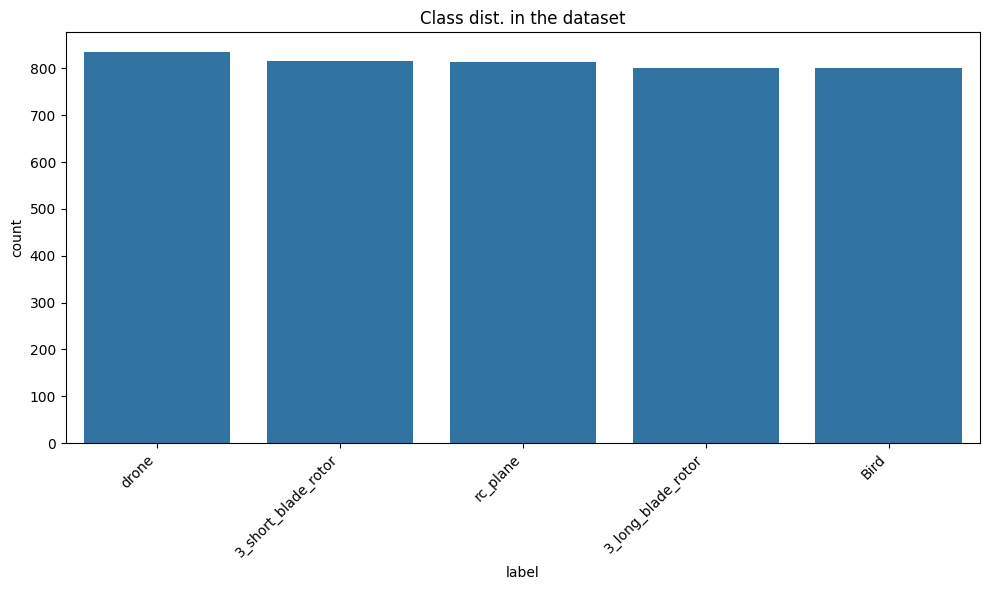


Sample Images per Class:

Class: 3_long_blade_rotor


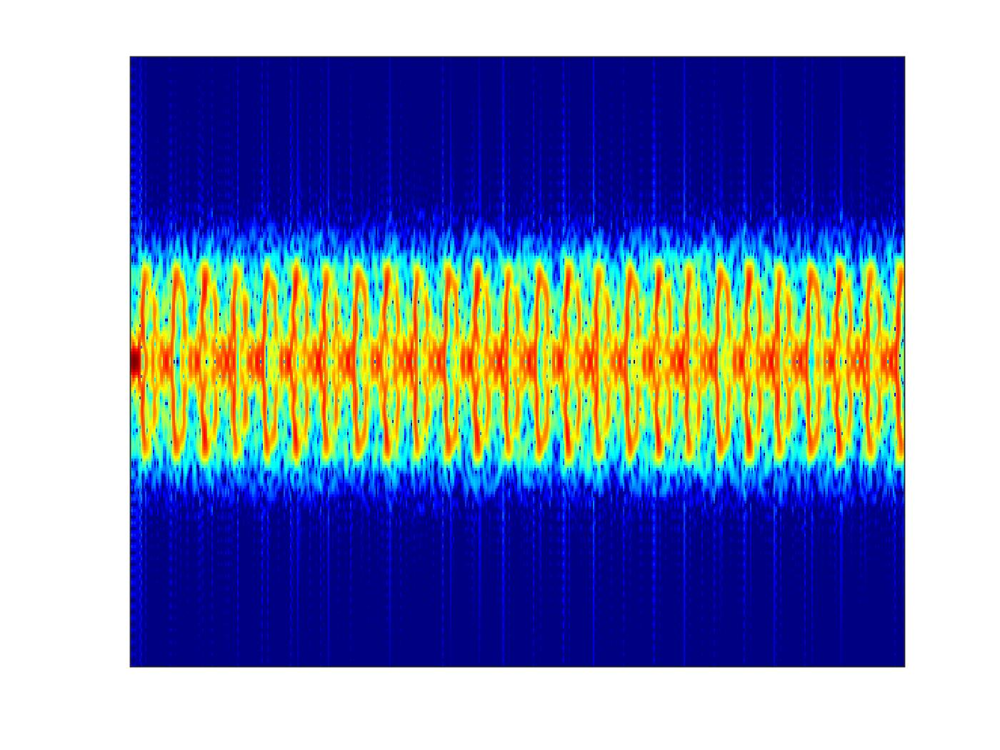


Class: 3_short_blade_rotor


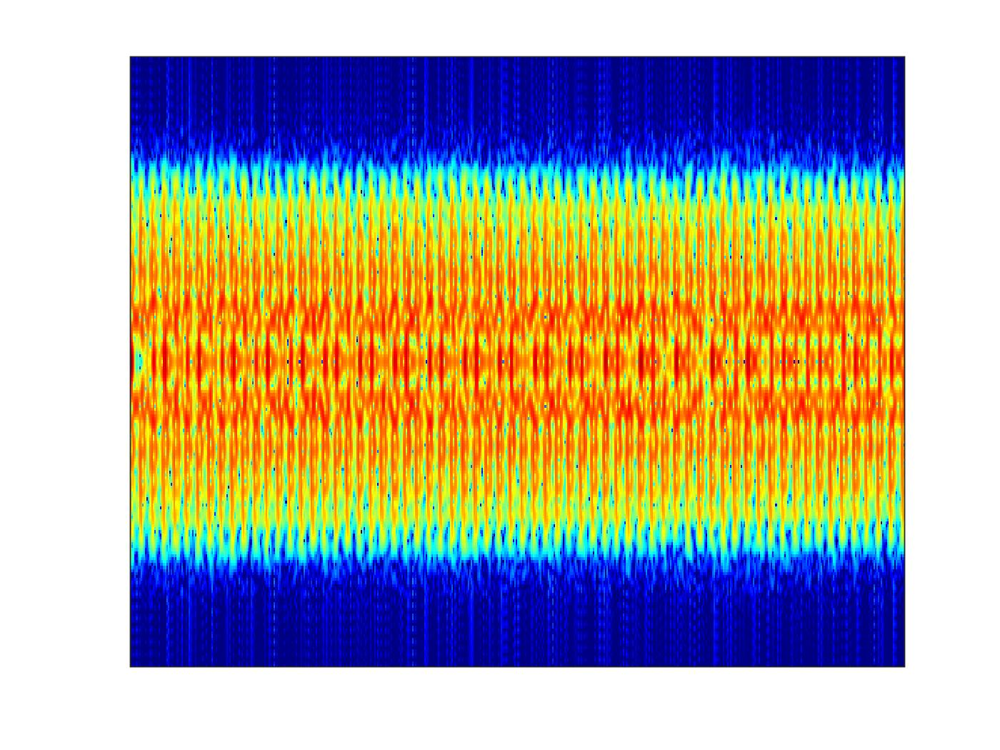


Class: Bird


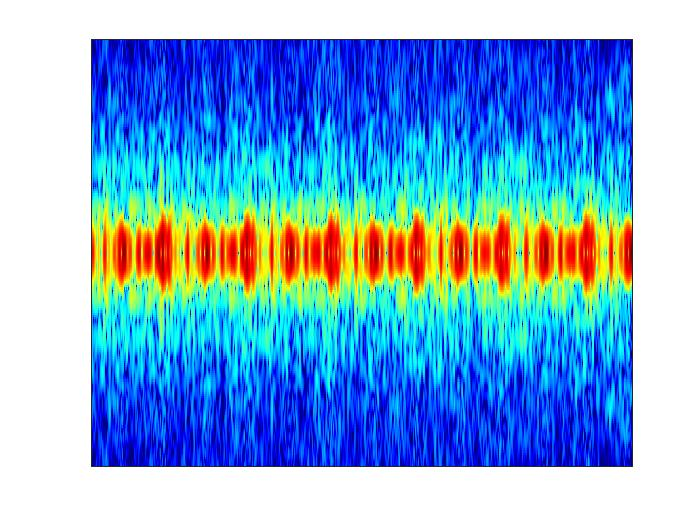


Class: drone


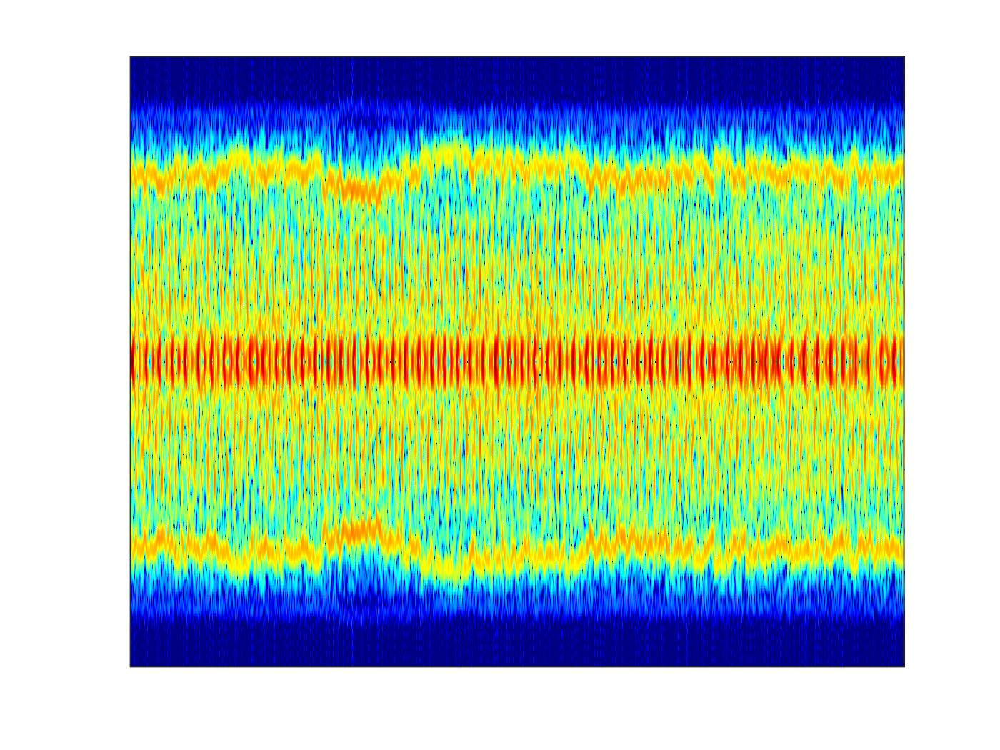


Class: rc_plane


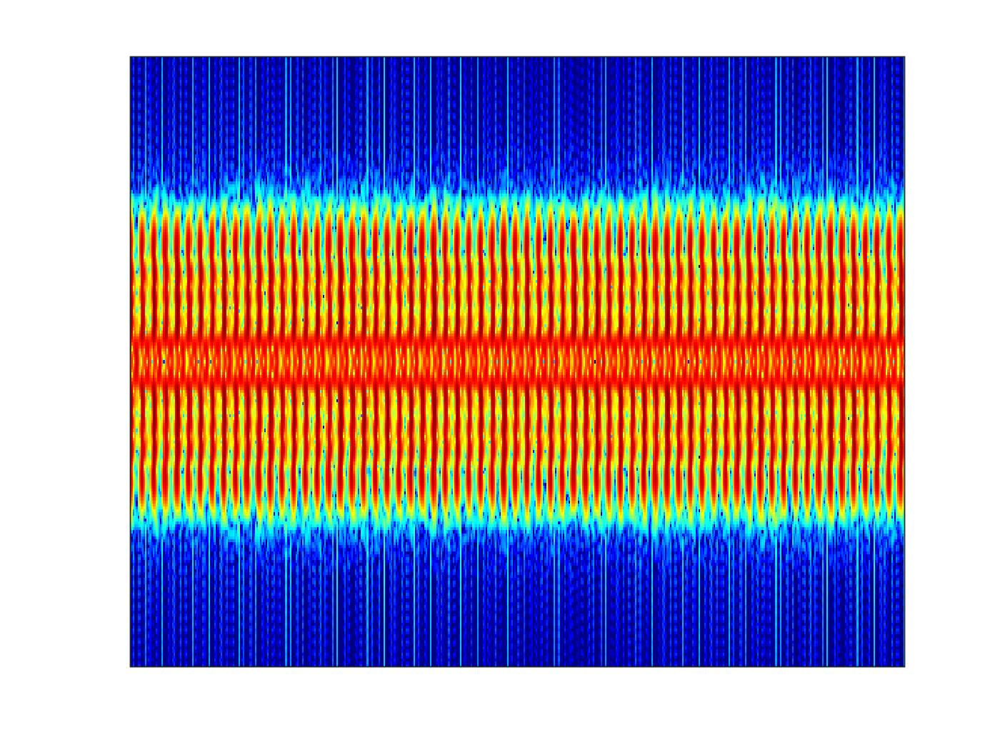

In [3]:
#Some EDA
all_images = get_image_files(dataset_path)
labels = [img.parent.name for img in all_images]

#Sanity checksfor analysis (Creating dataframes)
df = pd.DataFrame({'file': all_images, 'label': labels})
print(f"Total Images : {len(df)}")
print("class dist. : ")
print(df['label'].value_counts())

#Visualising
plt.figure(figsize=(10, 6))
sns.countplot(x='label' , data=df, order=df['label'].value_counts().index)
plt.title('Class dist. in the dataset')
plt.xticks(rotation=45, ha = 'right')
plt.tight_layout()
plt.show()

#sample of images per class
print("=" * 30)
print("\nSample Images per Class:")
print("=" * 30)
for label, group in df.groupby('label'):
    print(f"\nClass: {label}")
    first_image = group['file'].iloc[0]
    try:
        img = PILImage.create(first_image)
        display(img)
    except Exception as e:
        print(f"Error loading image for class {label}: {e}")

In [4]:
#Computing class weights for imbalance

unique_classes = np.unique(labels)
class_weights = compute_class_weight('balanced', classes = unique_classes, y=labels)
class_weights_dict = {cls:weight for cls, weight in zip(unique_classes, class_weights)}
print("class weights:", class_weights_dict)

class_weights_tensor = torch.tensor([class_weights_dict[cls] for cls in unique_classes], dtype=torch.float)

class weights: {np.str_('3_long_blade_rotor'): np.float64(1.01625), np.str_('3_short_blade_rotor'): np.float64(0.9963235294117647), np.str_('Bird'): np.float64(1.01625), np.str_('drone'): np.float64(0.9736526946107784), np.str_('rc_plane'): np.float64(0.9987714987714987)}


In [5]:
#splitting stratified

def stratified_splitter(items):
  labels = [item.parent.name for item in items]
  splitter = StratifiedShuffleSplit(n_splits=1, test_size= VALID_SPLIT, random_state=SEED)
  train_idx, valid_idx = next(splitter.split(items, labels))
  return train_idx, valid_idx

In [6]:
#datablock setup with augmentations
dblock = DataBlock(
    blocks = (ImageBlock, CategoryBlock),
    get_items = get_image_files,
    get_y = parent_label,
    splitter = stratified_splitter,
    item_tfms = Resize(IMG_SIZE, method='squish'), #squishing for spectrograms
    batch_tfms = [*aug_transforms(
        size = 224,
        max_rotate = 30,
        max_zoom = 1.3,
        max_warp = 0.2,
        p_affine = 0.75,
        p_lighting = 0.8
    ),
    Normalize.from_stats(*imagenet_stats)
    ]
)

Training images : 3252
Validation images : 813


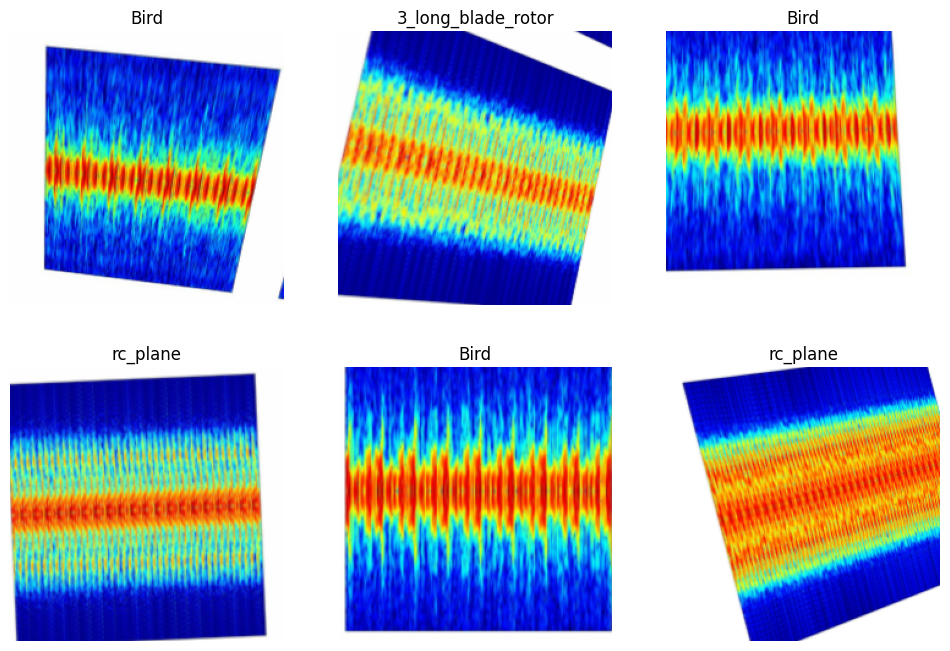

In [7]:
#create dataloaders

dls = dblock.dataloaders(dataset_path, bs=BATCH_SIZE)
dls.show_batch(max_n = 6, figsize=(12,8))
print(f"Training images : {len(dls.train_ds)}")
print(f"Validation images : {len(dls.valid_ds)}")

In [32]:
# Using fastai's built-in weighted cross-entropy loss
from fastai.losses import CrossEntropyLossFlat

# Create weight tensor in the order of dls.vocab (fastai's class ordering)
weight_tensor = torch.tensor([class_weights_dict[cls] for cls in dls.vocab], dtype=torch.float).to(dls.device)
loss_func = CrossEntropyLossFlat(weight=weight_tensor)

In [9]:
learn = vision_learner(dls, resnet50, loss_func=loss_func, metrics=[accuracy, error_rate]).to_fp16()
learn.fine_tune(5, base_lr=1e-3, cbs = [EarlyStoppingCallback(monitor='valid_loss', patience=3),
                                        SaveModelCallback(monitor='valid_loss', fname='best_model')
                                        ])

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:01<00:00, 83.4MB/s]
/usr/local/lib/python3.11/dist-packages/fastai/callback/fp16.py:47: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  self.autocast,self.learn.scaler,self.scales = autocast(dtype=dtype),GradScaler(**self.kwargs),L()
/usr/local/lib/python3.11/dist-packages/fastai/callback/fp16.py:47: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  self.autocast,self.learn.scaler,self.scales = autocast(dtype=dtype),GradScaler(**self.kwargs),L()


epoch,train_loss,valid_loss,accuracy,error_rate,time
0,0.919049,0.360024,0.873309,0.126691,12:59


Better model found at epoch 0 with valid_loss value: 0.3600236475467682.


epoch,train_loss,valid_loss,accuracy,error_rate,time
0,0.494610,0.264964,0.892989,0.107011,02:10
1,0.361821,0.161635,0.939729,0.060271,02:30
2,0.234460,0.195394,0.937269,0.062731,02:32
3,0.158439,0.148899,0.950800,0.049200,01:38
4,0.136415,0.151513,0.947109,0.052891,01:38


Better model found at epoch 0 with valid_loss value: 0.2649639844894409.
Better model found at epoch 1 with valid_loss value: 0.16163456439971924.
Better model found at epoch 3 with valid_loss value: 0.14889925718307495.


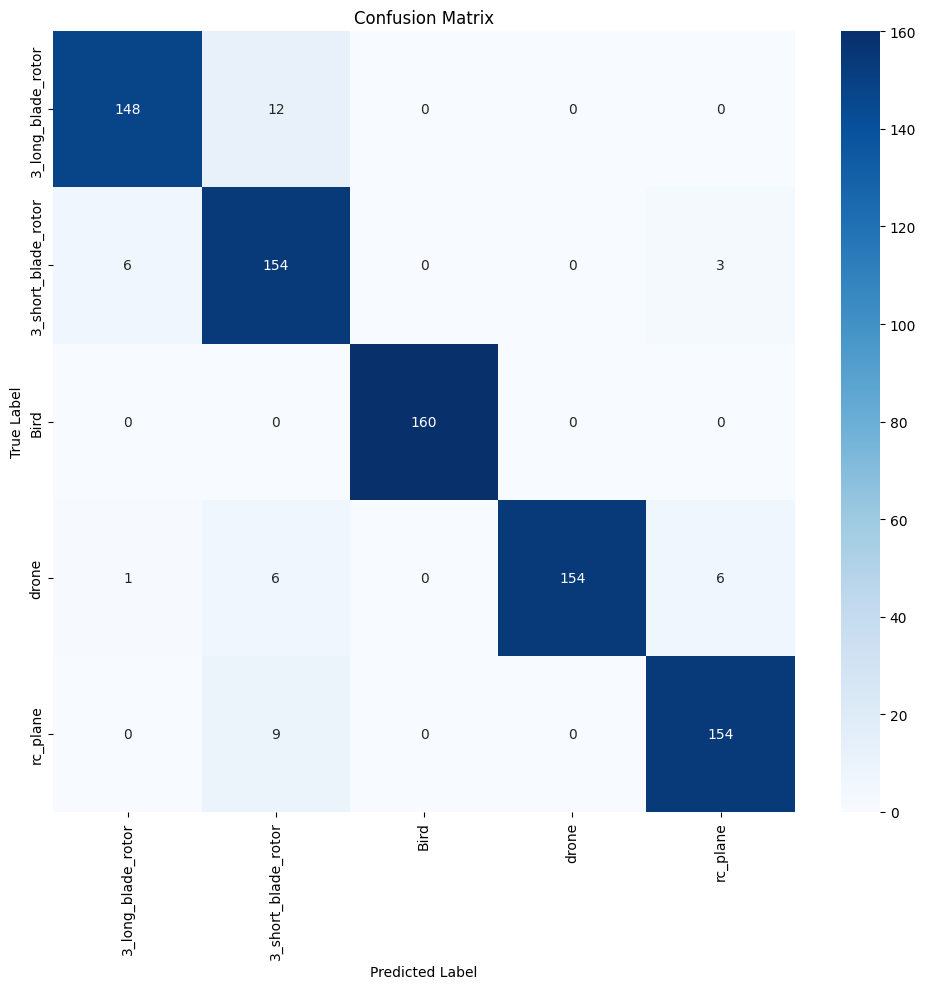


Classification Report:
                     precision    recall  f1-score   support

 3_long_blade_rotor     0.9548    0.9250    0.9397       160
3_short_blade_rotor     0.8508    0.9448    0.8953       163
               Bird     1.0000    1.0000    1.0000       160
              drone     1.0000    0.9222    0.9595       167
           rc_plane     0.9448    0.9448    0.9448       163

           accuracy                         0.9471       813
          macro avg     0.9501    0.9473    0.9479       813
       weighted avg     0.9501    0.9471    0.9478       813



In [35]:
# More robust approach - get predictions from validation set specifically
valid_preds, valid_targs = learn.get_preds(ds_idx=1)  # ds_idx=1 for validation set
pred_classes = valid_preds.argmax(dim=1)

# Manual confusion matrix using sklearn
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns

class_labels = list(dls.vocab)

# Confusion matrix
cm = confusion_matrix(valid_targs.cpu(), pred_classes.cpu())
plt.figure(figsize=(10,10))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_labels, yticklabels=class_labels)
plt.title('Confusion Matrix')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.tight_layout()
plt.show()

# Classification report
print("\nClassification Report:")
print(classification_report(valid_targs.cpu(), pred_classes.cpu(), target_names=class_labels, zero_division=0, digits=4))

In [36]:
#Exporting the model (adding version and metadata)
val_metrics = learn.validate()
model_name = f"resnet50-v1-acc{val_metrics[1]:.4f}.pkl"
learn.export(model_export_path / model_name)

pd.Series(dls.vocab).to_csv(model_export_path / 'vocab.csv', index=False)
pd.Series(class_weights_dict).to_csv(model_export_path / 'class_weights.csv')

/usr/local/lib/python3.11/dist-packages/fastai/callback/fp16.py:47: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  self.autocast,self.learn.scaler,self.scales = autocast(dtype=dtype),GradScaler(**self.kwargs),L()
/usr/local/lib/python3.11/dist-packages/fastai/callback/fp16.py:47: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  self.autocast,self.learn.scaler,self.scales = autocast(dtype=dtype),GradScaler(**self.kwargs),L()


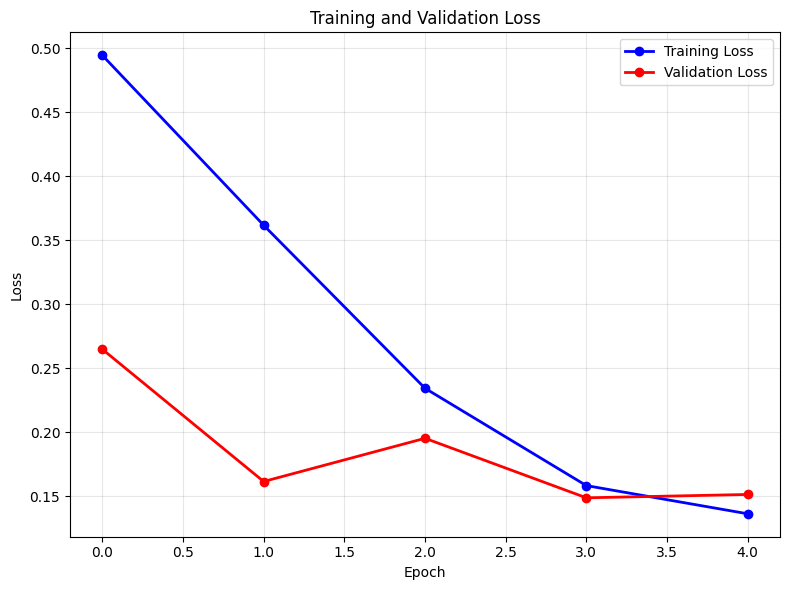

In [39]:
#Saving the training graph now
epochs = [0, 1, 2, 3, 4]
train_losses = [0.494610, 0.361821, 0.234460, 0.158439, 0.136415]
valid_losses = [0.264964, 0.161635, 0.195394, 0.148899, 0.151513]

plt.figure(figsize=(8, 6))
plt.plot(epochs, train_losses, 'b-o', label='Training Loss', linewidth=2, markersize=6)
plt.plot(epochs, valid_losses, 'r-o', label='Validation Loss', linewidth=2, markersize=6)
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig(model_export_path / 'loss_curve.png', dpi=300, bbox_inches='tight')
plt.show()

In [43]:
learn_inf = load_learner(model_export_path / model_name)

# Debug: Check the loaded model's vocabulary
print("Original model vocab:", dls.vocab)
print("Loaded model vocab:", learn_inf.dls.vocab)
print("Vocab lengths - Original:", len(dls.vocab), "Loaded:", len(learn_inf.dls.vocab))

Original model vocab: ['3_long_blade_rotor', '3_short_blade_rotor', 'Bird', 'drone', 'rc_plane']
Loaded model vocab: ['3_long_blade_rotor', '3_short_blade_rotor', 'Bird', 'drone', 'rc_plane']
Vocab lengths - Original: 5 Loaded: 5


Creating clean inference model...
Testing with image: /content/drive/MyDrive/DIAT-uSAT_dataset/Dataset/3_long_blade_rotor/figure119.jpg


Original Prediction: 3_long_blade_rotor
Probability Distribution:
  3_long_blade_rotor: 0.9976
  3_short_blade_rotor: 0.0013
  Bird: 0.0000
  drone: 0.0000
  rc_plane: 0.0010
Binary Classification: drone
Confidence: 0.9999


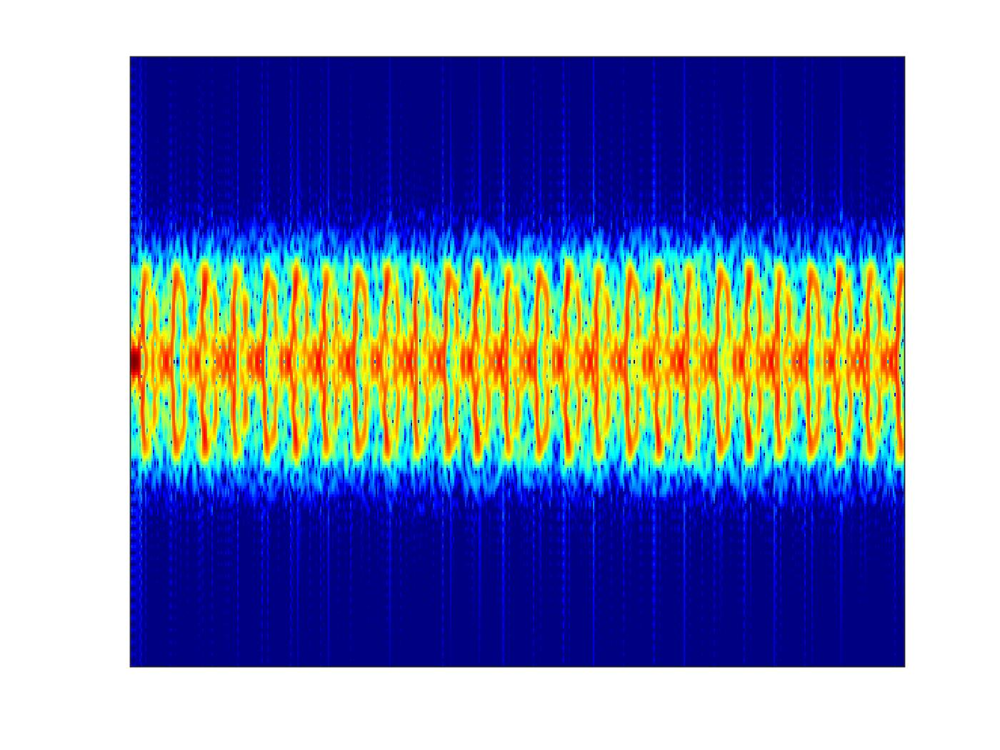

Clean model exported as: resnet50-clean-v1-acc0.9471.pkl


In [45]:
# Create a clean model for inference (without custom loss function)
print("Creating clean inference model...")

# Create a new learner with standard CrossEntropyLoss for inference
learn_clean = vision_learner(dls, resnet50, metrics=[accuracy, error_rate])

# Copy the trained weights from the original model
learn_clean.model.load_state_dict(learn.model.state_dict())

# Now test inference with the clean model
test_image_path = all_images[0]
print(f"Testing with image: {test_image_path}")

inference_image = PILImage.create(test_image_path)
pred_class, pred_idx, probs = learn_clean.predict(inference_image)

# Updated GROUP_MAPPING
GROUP_MAPPING = {
    '3_long_blade_rotor': 'drone',
    '3_short_blade_rotor': 'drone',
    'Bird': 'bird',
    'drone': 'drone',
    'rc_plane': 'drone'
}

bird_score, drone_score = 0.0, 0.0
for i, cls in enumerate(dls.vocab):
    prob = probs[i].item()
    group = GROUP_MAPPING.get(cls)
    if group == 'bird':
        bird_score += prob
    elif group == 'drone':
        drone_score += prob

final_pred = 'bird' if bird_score > drone_score else 'drone'
confidence = max(bird_score, drone_score)

print("="*50)
print(f"Original Prediction: {pred_class}")
print(f"Probability Distribution:")
for i, cls in enumerate(dls.vocab):
    print(f"  {cls}: {probs[i]:.4f}")
print("="*50)
print(f"Binary Classification: {final_pred}")
print(f"Confidence: {confidence:.4f}")
print("="*50)

display(inference_image)

# Export the clean model for future use
clean_model_name = f"resnet50-clean-v1-acc{val_metrics[1]:.4f}.pkl"
learn_clean.export(model_export_path / clean_model_name)
print(f"Clean model exported as: {clean_model_name}")